In [1]:
import pandas as pd

In [2]:
df=pd.read_csv("Datos_vis/brain.csv")

In [3]:
df.head()

,Index,Brain Weight,Body Weight
0,1,3.385,44.5
1,2,0.480,15.5
2,3,1.350,8.1
3,4,465.000,423.0
4,5,36.330,119.5


In [4]:
import altair as alt

In [5]:
alt.renderers.enable('notebook')

RendererRegistry.enable('notebook')

In [6]:
brain_char=alt.Chart(df).mark_bar().encode(
    x=alt.X("Brain Weight",bin=alt.Bin(maxbins=100)),
    y='count()'
)

body_char=alt.Chart(df).mark_bar().encode(
    x=alt.X("Body Weight",bin=alt.Bin(maxbins=100)),
    y='count()'
)
#en este momento se parece mucho a ggplot

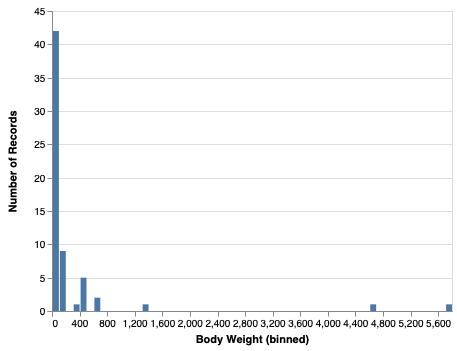

In [7]:
body_char

In [8]:
#guardamos el gráfico como HTML
body_char.save('char.html')

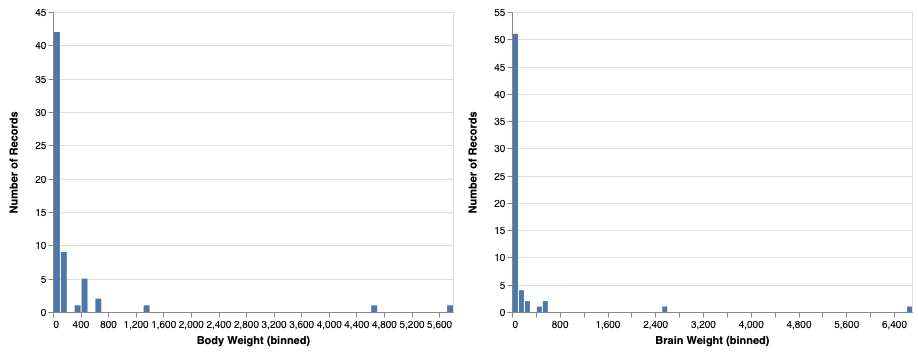

In [9]:
#Podemos tener gráficos multivista
total_chart=body_char|brain_char
total_chart

In [10]:
total_chart.save('total_chart.html')

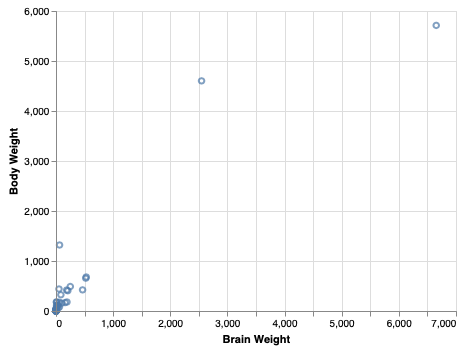

In [11]:
#Scatter plot. Lo hacemos en tableau (prototipo) y lo replicamos en altair
scatter=alt.Chart(df).mark_point().encode(
    x='Brain Weight',
    y='Body Weight'
)
scatter

In [12]:
#Lo bueno, es que altair te extrae de conocer todo lo que implica vega-lite (JSON y demás).

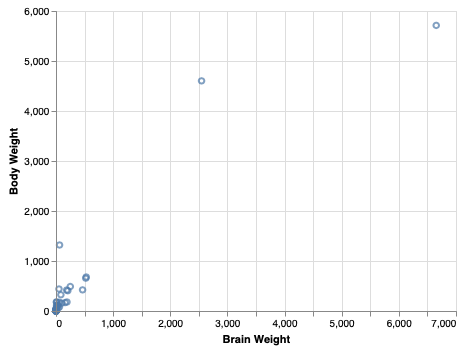

In [13]:
#interactividad
scatterI=alt.Chart(df).mark_point().encode(
    x='Brain Weight',
    y='Body Weight'
).interactive()
scatter

In [14]:
scatterI.save('scattercharI.html')

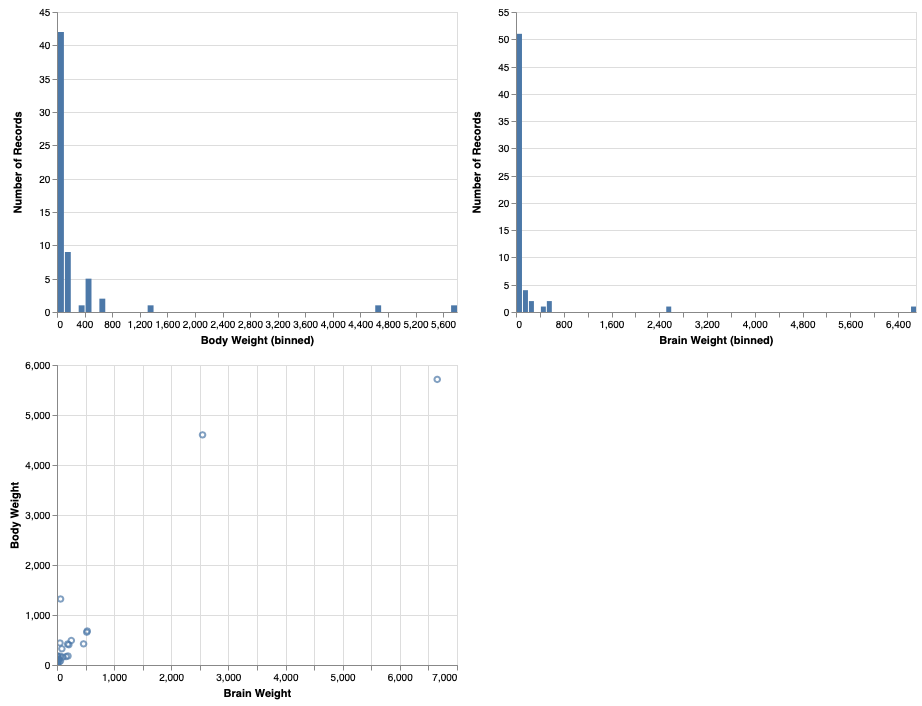

In [15]:
total_chart2=(body_char|brain_char)&scatterI
total_chart2

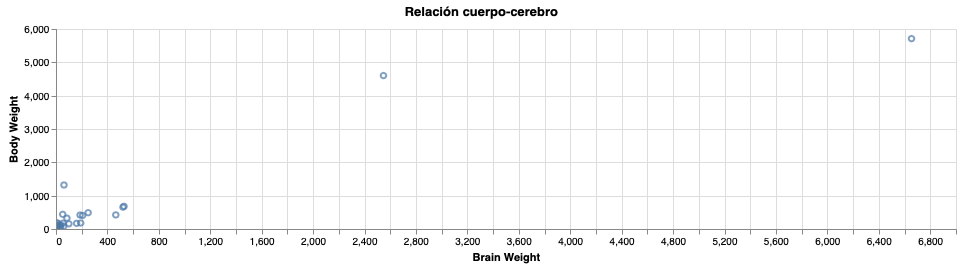

In [16]:
#interactividad
scatterI=alt.Chart(df).mark_point().encode(
    x='Brain Weight',
    y='Body Weight'
).interactive().properties(
    width=900,
    height=200,
    title='Relación cuerpo-cerebro'
)
scatterI

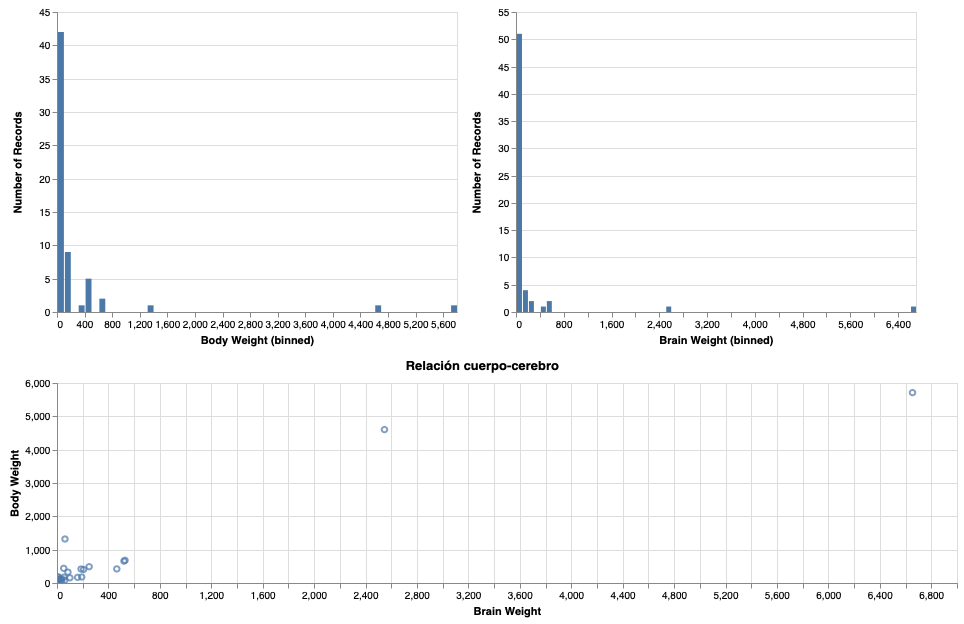

In [17]:
total_chart3=(body_char|brain_char)&scatterI
total_chart3

In [18]:
total_chart3.save('total_chart3_I.html')

In [19]:
#OTRO EJEMPLO (GOOGLE TRENDS)

In [20]:
trends=pd.read_csv("Datos_vis/google_trends.csv")
trends.head()

,date,search_term,value
0,2004-01,SPSS data,6
1,2004-02,SPSS data,8
2,2004-03,SPSS data,7
3,2004-04,SPSS data,7
4,2004-05,SPSS data,6


In [21]:
#vamos a tableau y pensamos/probamos las visualizaciones que queramos. Cuando las tengamos seguras, extrapolamos a altair

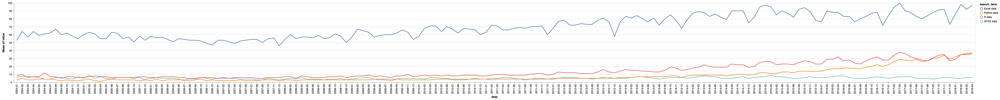

In [22]:
alt.Chart(trends).mark_line().encode(
    x='date',
    y='mean(value)',
    color='search_term'
)

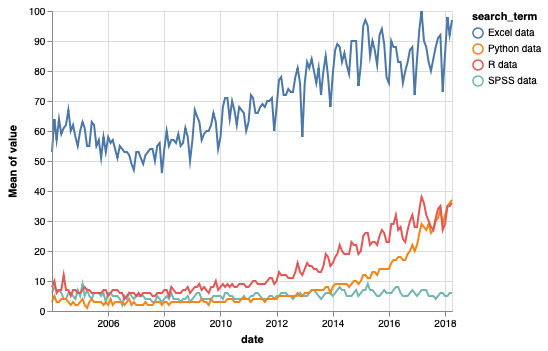

In [23]:
#EVOLUCIÓN
#Interpretando como fecha
line=alt.Chart(trends).mark_line().encode(
    x='date:T',
    y='mean(value)',
    color='search_term'
)
line

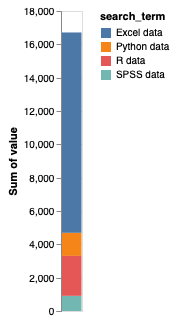

In [24]:
#COMPARACIÓN
comp=alt.Chart(trends).mark_bar().encode(
    y='sum(value)',
    color='search_term'
)
comp

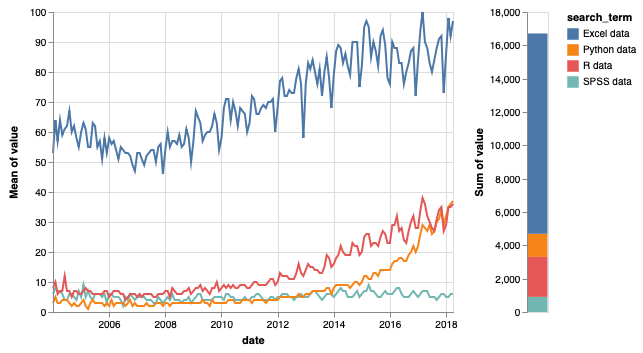

In [25]:
#vamos a combinar line y bar, nos fijamos cómo combina automaticamente las leyendas.
dash=line|comp
dash

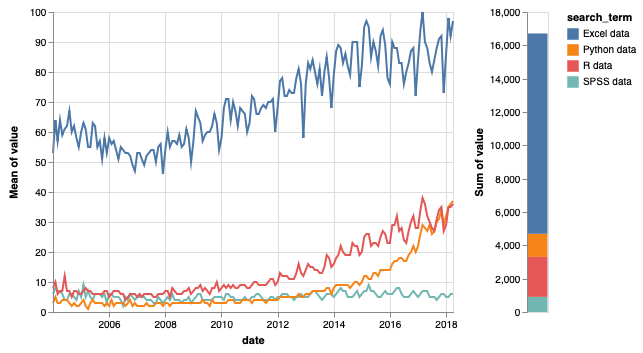

In [26]:
#Añadimos interactividad. Se hace con selecciones. una seleccion define 3 componentes. 1 como ocurre la interaccion. 2 que puntos están interactuando y 3 la funcion de interaccion.
#definimos esto para saber por qué aspecto filtrar.
select_search_term=alt.selection_single(encodings=['color'])

line=alt.Chart(trends).mark_line().encode(
    x='date:T',
    y='mean(value)',
    color='search_term'
).transform_filter(
select_search_term.ref())
#este primero se verá afectado por el filtro

comp=alt.Chart(trends).mark_bar().encode(
    y='sum(value)',
    color='search_term',
    tooltip='sum(value)'#para que al pasar por encima se vea la suma
).properties(
selection=select_search_term)
#en vez de hacer una selection en propoerties, puedo hacer lo mismo usando add_selection() sobre el gráfico que queramos
#hará de filtro


dash2=line|comp
dash2

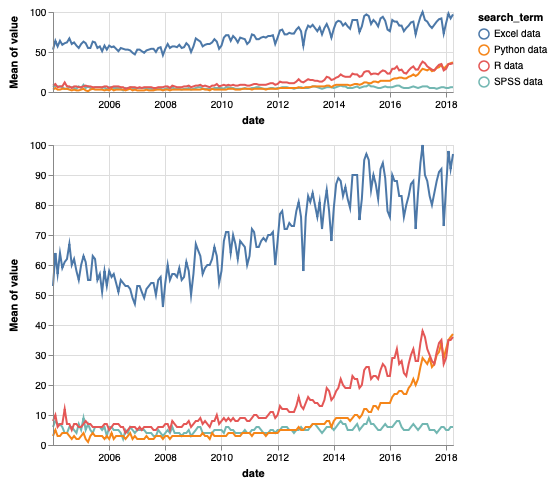

In [27]:
select_date=alt.selection_interval(encodings=['x'])

lineLittle=alt.Chart(trends).mark_line().encode(
    x='date:T',
    y='mean(value)',
    color='search_term'
).properties(
    height=80,
    selection=select_date
)


line=alt.Chart(trends).mark_line().encode(
    x='date:T',
    y='mean(value)',
    color='search_term'
).transform_filter(
    select_date.ref()
)

lineLittle&line

In [28]:
#ejercicio con banks.csv

In [29]:
banks=pd.read_csv("Datos_vis/banks.csv")
banks.head()

,Unnamed: 0,Financial Institution Number,Institution Name,Institution Type,Charter Type,Headquarters,Failure Date,Insurance Fund,Certificate Number,Transaction Type,Total Deposits,Total Assets,Estimated Loss (2015)
0,0,NaN,BANK OF AMERICA TRUST CO.,COMMERCIAL BANK,STATE,PITTSBURGH,4/19/1934,FDIC,NaN,PAYOUT,1064,1435.0,NaN
1,1,NaN,FON DU LAC STATE BANK,COMMERCIAL BANK,STATE,EAST PEORIA,5/28/1934,FDIC,NaN,PAYOUT,238,374.0,NaN
2,2,NaN,FIRST NATIONAL BANK OF LIMA,COMMERCIAL BANK,FEDERAL,LIMA,7/18/1934,FDIC,NaN,PAYOUT,42,91.0,NaN
3,3,NaN,FLORENCE DEPOSIT BANK,COMMERCIAL BANK,STATE,FLORENCE,7/18/1934,FDIC,NaN,PAYOUT,69,105.0,NaN
4,4,NaN,BANK OF LEWISPORT,COMMERCIAL BANK,STATE,LEWISPORT,8/6/1934,FDIC,NaN,PAYOUT,68,81.0,NaN


In [30]:
#composicion
#... hacer

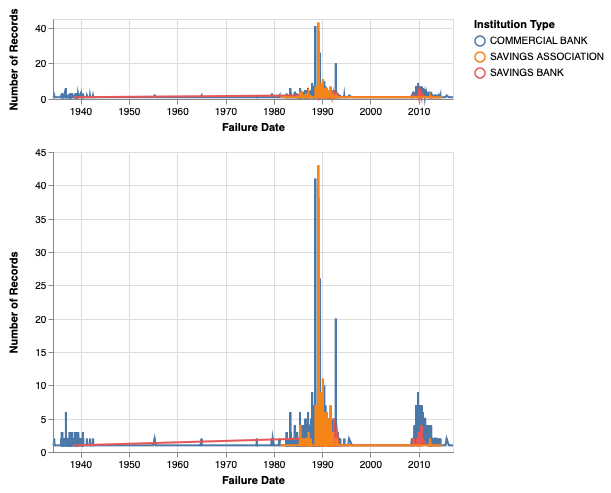

In [31]:
#evolución
select_date=alt.selection_interval(encodings=['x'])

lineLittle=alt.Chart(banks).mark_line().encode(
    x='Failure Date:T',
    #y='mean(Estimated Loss (2015))',
    y='count()',
    color='Institution Type'
).properties(
    height=80,
    selection=select_date
)


line=alt.Chart(banks).mark_line().encode(
    x='Failure Date:T',
    #y='mean(Estimated Loss (2015))',
    y='count()',
    color='Institution Type'
).transform_filter(
    select_date.ref()
)

lineLittle&line

**Altair Parte 2**

In [32]:
import pandas as pd

import altair as alt
alt.renderers.enable('notebook')

RendererRegistry.enable('notebook')

In [33]:
temp=pd.read_csv("Datos_vis/worldTemperatures.csv",header=None)
#le ponemos las columnas que nos manda Sebas (basecamp)
temp.columns=["0", "1", "2", "date", "4", 'temp', "6", "7", "8", "9", "10", 'latitude', 'longitude',
        'country','city',]
temp["date"]=pd.to_datetime(temp["date"],format="%Y%m%d")
temp.head()

,0,1,2,date,4,temp,6,7,8,9,10,latitude,longitude,country,city
0,0,51957,IVM00065594,2016-01-01,TAVG,28.3,H,NaN,S,NaN,SPY,4.746717,-6.660817,Ivory Coast,San Pedro
1,1,141546,IVM00065594,2016-01-02,TAVG,27.9,H,NaN,S,NaN,SPY,4.746717,-6.660817,Ivory Coast,San Pedro
2,2,231680,IVM00065594,2016-01-03,TAVG,26.8,H,NaN,S,NaN,SPY,4.746717,-6.660817,Ivory Coast,San Pedro
3,3,323605,IVM00065594,2016-01-04,TAVG,27.6,H,NaN,S,NaN,SPY,4.746717,-6.660817,Ivory Coast,San Pedro
4,4,416249,IVM00065594,2016-01-05,TAVG,27.2,H,NaN,S,NaN,SPY,4.746717,-6.660817,Ivory Coast,San Pedro


In [34]:
temp.dtypes

0                     int64
1                     int64
2                    object
date         datetime64[ns]
4                    object
temp                float64
6                    object
7                   float64
8                    object
9                   float64
10                   object
latitude            float64
longitude           float64
country              object
city                 object
dtype: object

In [35]:
#Gráfico de barras con los paises con mejor temperatura.
#Si no soy capaz de visualizar el gráfico puedo ayudarme de Tableau, y cuando lo tenga claro me paso a altair

alt.Chart(temp).mark_bar().encode(
    x='country',
    y='mean(temp)'
)
#aquí podemos hacer sólo 5000 filas, es más un problema de HTML. De ahí el error que nos dá al ejecutar esto.
#experimentos indican que más de 100.000 filas, se ralentiza mucho

MaxRowsError: The number of rows in your dataset is greater than the maximum allowed (5000). For information on how to plot larger datasets in Altair, see the documentation

Chart({
  data:           0        1            2       date     4  temp  6   7  8   9   10  \
  0         0    51957  IVM00065594 2016-01-01  TAVG  28.3  H NaN  S NaN  SPY   
  1         1   141546  IVM00065594 2016-01-02  TAVG  27.9  H NaN  S NaN  SPY   
  2         2   231680  IVM00065594 2016-01-03  TAVG  26.8  H NaN  S NaN  SPY   
  3         3   323605  IVM00065594 2016-01-04  TAVG  27.6  H NaN  S NaN  SPY   
  4         4   416249  IVM00065594 2016-01-05  TAVG  27.2  H NaN  S NaN  SPY   
  5         5   508720  IVM00065594 2016-01-06  TAVG  25.2  H NaN  S NaN  SPY   
  6         6   600638  IVM00065594 2016-01-07  TAVG  26.2  H NaN  S NaN  SPY   
  7         7   691976  IVM00065594 2016-01-08  TAVG  26.4  H NaN  S NaN  SPY   
  8         8   782333  IVM00065594 2016-01-09  TAVG  25.7  H NaN  S NaN  SPY   
  9         9   871722  IVM00065594 2016-01-10  TAVG  26.6  H NaN  S NaN  SPY   
  10       10   962822  IVM00065594 2016-01-11  TAVG  27.6  H NaN  S NaN  SPY   
  11       11 

In [36]:
temp.shape

(152433, 15)

In [37]:
#Vamos a habilitar 15000 filas para poder visualizar, para ello redefinimos un dataframe agrupando el original.
temp2=temp.groupby('country').mean().reset_index()
temp2.head()

,country,0,1,temp,7,9,latitude,longitude
0,Afghanistan,50.000000,4.432172e+06,6.508581,NaN,NaN,35.423903,67.650326
1,Albania,50.000000,4.451862e+06,10.795050,NaN,NaN,41.421900,19.712960
2,Algeria,49.519824,4.457370e+06,13.437323,NaN,NaN,33.835387,3.693988
3,Angola,50.000000,4.467857e+06,28.233663,NaN,NaN,-8.858375,13.231178
4,Armenia,50.000000,4.441034e+06,-2.880198,NaN,NaN,40.720000,43.830000


In [38]:
temp2.shape

(156, 8)

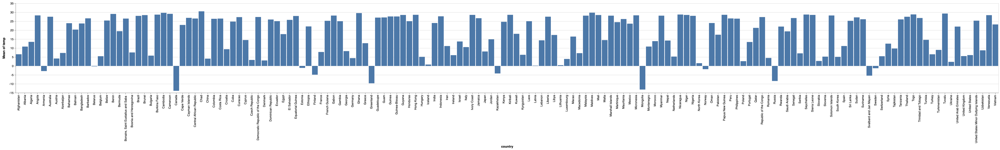

In [39]:
alt.Chart(temp2).mark_bar().encode(
    x='country',
    y='mean(temp)'
)

In [40]:
#Es importante que tengamos la agregacion fuera de altair, 
#ya que este solo tiene que preocuparse de la contruccion del gráfico.

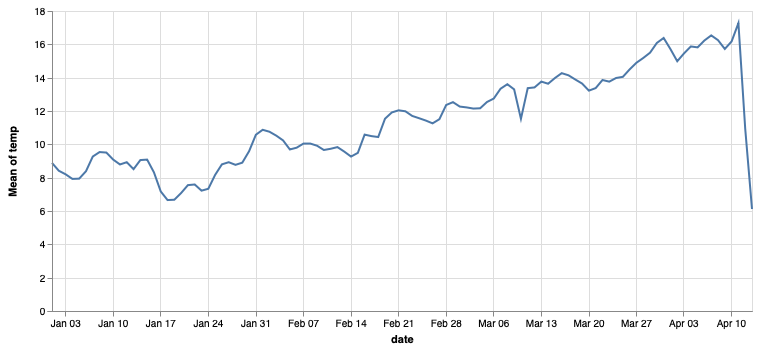

In [41]:
#Muestro la temperatura de cada país al día

temp3=temp.groupby('date').mean().reset_index()

alt.Chart(temp3).mark_line().encode(
    x='date',
    y='mean(temp)'
).properties(
    width=700
)

In [42]:
#shift+m fusiona dos celdas

In [43]:
temp2=temp.groupby('country').mean().reset_index()
bar=alt.Chart(temp2).mark_bar().encode(
    x='country',
    y='mean(temp)'
)

temp3=temp.groupby('date').mean().reset_index()
line=alt.Chart(temp3).mark_line().encode(
    x='date',
    y='mean(temp)'
)

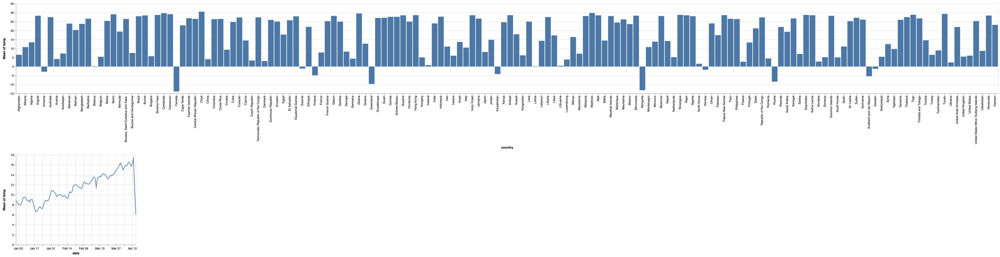

In [44]:
bar&line

In [45]:
temp4=temp.groupby(['country','date']).mean().reset_index()

bar=alt.Chart(temp4).mark_bar().encode(
    x='country',
    y='temp'
)


line=alt.Chart(temp4).mark_line().encode(
    x='date',
    y='mean(temp)'
)

bar&line

MaxRowsError: The number of rows in your dataset is greater than the maximum allowed (5000). For information on how to plot larger datasets in Altair, see the documentation

VConcatChart({
  vconcat: [Chart({
    data:            country       date      0             1       temp   7   9  \
    0      Afghanistan 2016-01-01   0.00  3.086700e+04   4.433333 NaN NaN   
    1      Afghanistan 2016-01-02   1.00  1.203700e+05   6.366667 NaN NaN   
    2      Afghanistan 2016-01-03   2.00  2.104250e+05   4.300000 NaN NaN   
    3      Afghanistan 2016-01-04   3.00  3.016690e+05   2.433333 NaN NaN   
    4      Afghanistan 2016-01-05   4.00  3.944537e+05   1.333333 NaN NaN   
    5      Afghanistan 2016-01-06   5.00  4.869970e+05   1.200000 NaN NaN   
    6      Afghanistan 2016-01-07   6.00  5.790267e+05   2.700000 NaN NaN   
    7      Afghanistan 2016-01-08   7.00  6.705297e+05   2.433333 NaN NaN   
    8      Afghanistan 2016-01-09   8.00  7.612647e+05   3.400000 NaN NaN   
    9      Afghanistan 2016-01-10   9.00  8.506667e+05   3.366667 NaN NaN   
    10     Afghanistan 2016-01-11  10.00  9.411077e+05   1.566667 NaN NaN   
    11     Afghanistan 2016-01-12  

In [46]:
#tenemos el mismo problema, al hacer el groupby por dos campos, aumenta el nº de filas.

In [47]:
#solución (basecamp)
## Overide the limit
from altair import pipe, limit_rows, to_values
t = lambda data: pipe(data, limit_rows(max_rows=150000), to_values)
alt.data_transformers.register('custom', t)
alt.data_transformers.enable('custom')

DataTransformerRegistry.enable('custom')

In [48]:
temp4=temp.groupby(['country','date']).mean().reset_index()

select_country=alt.selection_single(encodings=['color'])

bar=alt.Chart(temp4).mark_bar().encode(
    y='country',
    x='temp',
    color='country'
).properties(
    width=200,
    selection=select_country
)


line=alt.Chart(temp4).mark_line().encode(
    x='date',
    y='mean(temp)'
).transform_filter(
    select_country.ref()
)

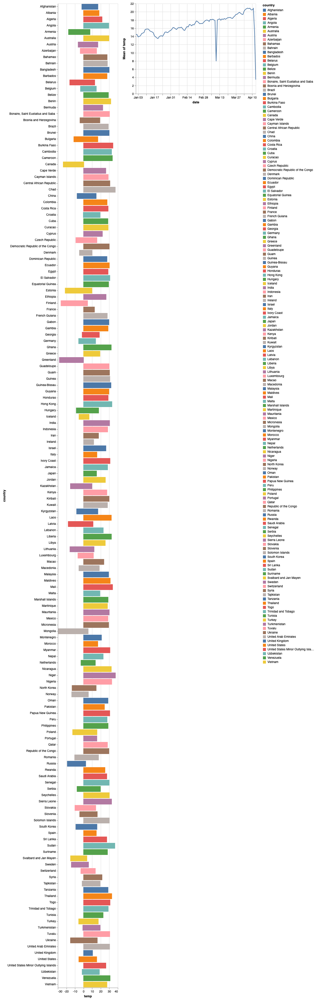

In [49]:
bar|line

In [50]:
#Mapas
alt.Chart(temp).mark_point().encode(
    longitude='longitude',
    latitude='latitude'
)

MaxRowsError: The number of rows in your dataset is greater than the maximum allowed (150000). For information on how to plot larger datasets in Altair, see the documentation

Chart({
  data:           0        1            2       date     4  temp  6   7  8   9   10  \
  0         0    51957  IVM00065594 2016-01-01  TAVG  28.3  H NaN  S NaN  SPY   
  1         1   141546  IVM00065594 2016-01-02  TAVG  27.9  H NaN  S NaN  SPY   
  2         2   231680  IVM00065594 2016-01-03  TAVG  26.8  H NaN  S NaN  SPY   
  3         3   323605  IVM00065594 2016-01-04  TAVG  27.6  H NaN  S NaN  SPY   
  4         4   416249  IVM00065594 2016-01-05  TAVG  27.2  H NaN  S NaN  SPY   
  5         5   508720  IVM00065594 2016-01-06  TAVG  25.2  H NaN  S NaN  SPY   
  6         6   600638  IVM00065594 2016-01-07  TAVG  26.2  H NaN  S NaN  SPY   
  7         7   691976  IVM00065594 2016-01-08  TAVG  26.4  H NaN  S NaN  SPY   
  8         8   782333  IVM00065594 2016-01-09  TAVG  25.7  H NaN  S NaN  SPY   
  9         9   871722  IVM00065594 2016-01-10  TAVG  26.6  H NaN  S NaN  SPY   
  10       10   962822  IVM00065594 2016-01-11  TAVG  27.6  H NaN  S NaN  SPY   
  11       11 

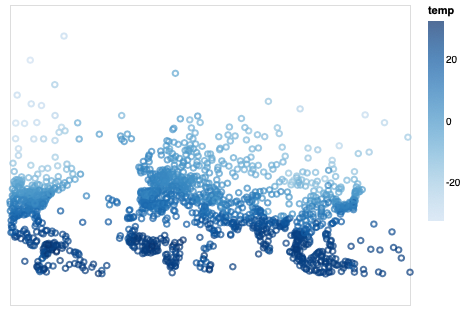

In [51]:
temp5=temp.groupby('city').mean().reset_index()
alt.Chart(temp5).mark_point().encode(
    longitude='longitude',
    latitude='latitude',
    color='temp'
)

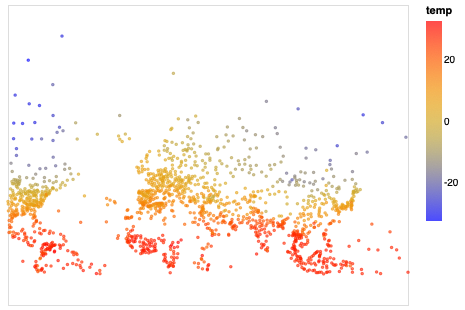

In [52]:
temp5=temp.groupby('city').mean().reset_index()
points=alt.Chart(temp5).mark_point().encode(
    longitude='longitude',
    latitude='latitude',
    color=alt.Color('temp',scale=alt.Scale(range=['blue','yellow','red'])),
    size=alt.value(2)
)
points

In [53]:
#la forma geográdica se codifica en geojson.io (http://geojson.io/#map=2/22.6/1.4)
#puedo tener info como lineas, puntos o polígonos.
#cuando quiero representar paises, utilizo polígonos con más o menos precisión.
#topoJSON es una compresion de geoJSON.

#en internet ya hay disponible geojson con info de los paises.

#URL que contiene topojson de todos los paises: https://unpkg.com/world-atlas@1/word/110m.json

#google maps usa KML, pero luego pudeo transformar en geojson para poder usar en altair.

In [54]:
url='https://unpkg.com/world-atlas@1/world/110m.json'

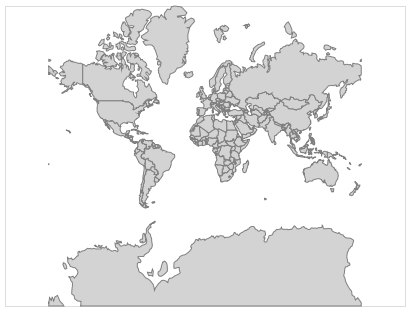

In [55]:
countries=alt.topo_feature(url,feature="countries")
background=alt.Chart(countries).mark_geoshape(
    fill='lightgrey',
    stroke='grey'
)
background

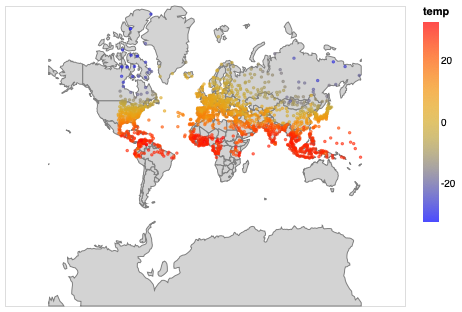

In [56]:
background+points

In [57]:
#no se puede hacer interactive en este tipo de gráficos.
#para hacer zoom hay otra librería: folium --> que permite crear mapas dinámicos

#primero instalar la librería: conda install folium -c conda-forge

In [58]:
import folium
m=folium.Map()
m

In [59]:
folium.Marker([45.3288,-121.6625],popup='Mt.').add_to(m)
m#indicando la tupla lat,long y luego el texto que quieres que aparezca cuando clikes


In [60]:
m.save('test.html')

Locales

In [61]:
base_path="/Users/antoniobravomunoz/Documents/DATA_SCIENCE_MASTER/Visualization Classes/pingendo/charts/"

In [62]:
df=pd.read_csv("Datos_vis/locales_madrid.csv")

/Users/antoniobravomunoz/anaconda3/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2785: DtypeWarning: Columns (31,32,37,38) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [63]:
#nos quedamos con los bares
temp=df[df['rotulo'].str.contains('BAR')]
temp.head()

,id_local,id_distrito_local,desc_distrito_local,id_barrio_local,desc_barrio_local,cod_barrio_local,id_seccion_censal_local,desc_seccion_censal_local,coordenada_x_local,coordenada_y_local,...,coordenada_y_agrup,id_agrupacion,nombre_agrupacion,id_tipo_agrup,desc_tipo_agrup,id_planta_agrupado,id_local_agrupado,rotulo,lat,lon
1,10000097,1,CENTRO,104,JUSTICIA,NaN,NaN,77,"440961,09","4475065,95",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,BARRIGA LLENA,40.424132,-3.695971
2,10000150,1,CENTRO,106,SOL,NaN,NaN,121,"440154,52","4474271,6",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CAFE LOS ARCOS BAR,40.416918,-3.705404
9,10000476,1,CENTRO,102,EMBAJADORES,NaN,NaN,23,"439930,15","4473724,38",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,BAR MARISQUERIA LA PALOMA,40.411973,-3.707996
10,10000004,1,CENTRO,105,UNIVERSIDAD,NaN,NaN,106,"440055,41","4475799,55",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,BAR LA PARADA ...,40.430676,-3.706716
30,10000982,1,CENTRO,101,PALACIO,NaN,NaN,14,"439775,2","4473865,23",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,BAR JUANA LA LOCA ...,40.413230,-3.709836


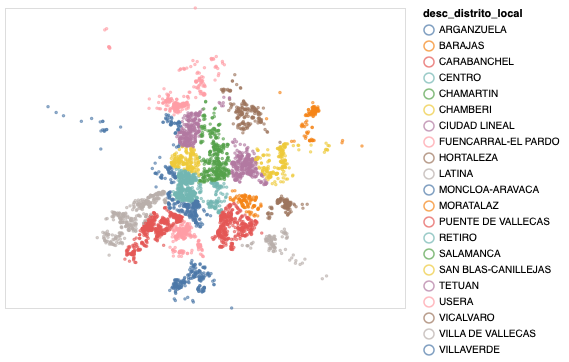

In [64]:
points=alt.Chart(temp).mark_point().encode(
    longitude='lon',
    latitude='lat',
    color=alt.Color('desc_distrito_local'),
    size=alt.value(2)
)
points

In [65]:
#esto no sé para qué es:
#for i, row in temp.iterrows():
#    folium.Marker([row('lat'),i('lon')]).add_to(m)

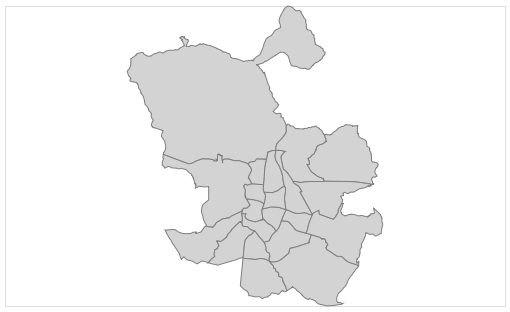

In [66]:
#fondo madrid
counties = alt.Data(url="https://raw.githubusercontent.com/codeforamerica/click_that_hood/master/public/data/madrid-districts.geojson",
                    format={"property":"features"})

madrid = alt.Chart(counties).mark_geoshape(fill='lightgrey',stroke='grey').encode().properties(
    width=500,
    height=300
)
madrid

In [67]:
mapa1=madrid+points
mapa1.save(base_path+'mapa1.html')

In [68]:
#Con folium
m2=folium.Map()

for i, row in temp.iloc[:100].iterrows():
    #folium.Marker([row['lat'],row['lon']],popup=row['rotulo']).add_to(m2)
    folium.Marker([row['lat'],row['lon']],popup='BAR').add_to(m2)

m2

In [69]:
#ajustando el mapa con las coordenadas de madrid y zoom
m2=folium.Map(location=[40.41,-3.7],zoom_start=13)

for i, row in temp.iloc[:100].iterrows():
    #folium.Marker([row['lat'],row['lon']],popup=row['rotulo']).add_to(m2)
    folium.Marker([row['lat'],row['lon']],popup='BAR').add_to(m2)

m2

In [70]:
m2.save('Bares_mad.html')

In [71]:
#ahora vamos a publicar los resultados con pingendo y github